In [1]:
import ccxt
import numpy as np
import pandas as pd
import datetime as dt
from dateutil import tz
import matplotlib.pyplot as plt

import json
import time
import os
import sys

In [2]:
src_path = '../src/'
sys.path.append(os.path.abspath(src_path))
from func_get import *
from func_signal import *
from func_backtest import *

In [3]:
start_ts = time.time()

In [4]:
interval_dict = {
    '1m': 1,
    '5m': 5,
    '15m': 15,
    '30m': 30,
    '1h': 60,
    '2h': 120,
    '4h': 240,
    '1d': 1440
}

In [5]:
with open('../../../_keys/ftx/ftx_read_keys.json') as keys_file:
    keys_dict = json.load(keys_file)
    
exchange = ccxt.ftx({'apiKey': keys_dict['apiKey'],
                     'secret': keys_dict['secret'],
                     'enableRateLimit': True})

### Config

In [6]:
project_name = 'cryptoris_1h'

In [7]:
start_date = dt.datetime(2021, 1, 1)
start_hour = 0
end_date = dt.datetime.today() - dt.timedelta(days=1)
reinvest_profit_flag = True

In [8]:
config_params = {
    'safety_ohlcv_range': 1000,
    'action_timeframe': '1h',
    'base': {
        'symbol': ['ETH-PERP', 'SOL-PERP', 'LUNA-PERP'],
        'open': {
            '1h': {
                'ema': {
                    'check': [check_signal_price],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': [check_signal_price],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': [check_signal_band],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            },
            '4h': {
                'ema': {
                    'check': [check_signal_price],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': [check_signal_price],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': [check_signal_band],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }        
            }    
            
        },
        'close': {
            '1h': {
                'supertrend': {
                    'check': [check_signal_price],
                    'look_back': 0,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': [check_signal_band],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }    
            }
        }
    },
    'lead': {
        'symbol': ['BTC-PERP'],
        'open': {
            '1h': {
                'wt': {
                    'check': [check_signal_band],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            }
        },
        'close': {
        }
    },
    'tp': {
        'price_percent': 5,
        'signal': None,
    },
    'sl': {
        'price_percent': None,
        'signal': {
            'timeframe': '1h',
            'signal': {
                'supertrend': {
                    'look_back': 0,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                }
            }
        }
    },
    'action_percent': 0.1,
    'leverage': 5,
    'taker_fee': 0.07
}

### Get data

In [9]:
ohlcv_df_dict = get_data(exchange, start_date, end_date, start_hour, interval_dict, config_params)

base: timeframe 1/2 symbol 1/3 date 1/588
base: timeframe 1/2 symbol 1/3 date 2/588
base: timeframe 1/2 symbol 1/3 date 3/588
base: timeframe 1/2 symbol 1/3 date 4/588
base: timeframe 1/2 symbol 1/3 date 5/588
base: timeframe 1/2 symbol 1/3 date 6/588
base: timeframe 1/2 symbol 1/3 date 7/588
base: timeframe 1/2 symbol 1/3 date 8/588
base: timeframe 1/2 symbol 1/3 date 9/588
base: timeframe 1/2 symbol 1/3 date 10/588
base: timeframe 1/2 symbol 1/3 date 11/588
base: timeframe 1/2 symbol 1/3 date 12/588
base: timeframe 1/2 symbol 1/3 date 13/588
base: timeframe 1/2 symbol 1/3 date 14/588
base: timeframe 1/2 symbol 1/3 date 15/588
base: timeframe 1/2 symbol 1/3 date 16/588
base: timeframe 1/2 symbol 1/3 date 17/588
base: timeframe 1/2 symbol 1/3 date 18/588
base: timeframe 1/2 symbol 1/3 date 19/588
base: timeframe 1/2 symbol 1/3 date 20/588
base: timeframe 1/2 symbol 1/3 date 21/588
base: timeframe 1/2 symbol 1/3 date 22/588
base: timeframe 1/2 symbol 1/3 date 23/588
base: timeframe 1/2 

base: timeframe 1/2 symbol 1/3 date 191/588
base: timeframe 1/2 symbol 1/3 date 192/588
base: timeframe 1/2 symbol 1/3 date 193/588
base: timeframe 1/2 symbol 1/3 date 194/588
base: timeframe 1/2 symbol 1/3 date 195/588
base: timeframe 1/2 symbol 1/3 date 196/588
base: timeframe 1/2 symbol 1/3 date 197/588
base: timeframe 1/2 symbol 1/3 date 198/588
base: timeframe 1/2 symbol 1/3 date 199/588
base: timeframe 1/2 symbol 1/3 date 200/588
base: timeframe 1/2 symbol 1/3 date 201/588
base: timeframe 1/2 symbol 1/3 date 202/588
base: timeframe 1/2 symbol 1/3 date 203/588
base: timeframe 1/2 symbol 1/3 date 204/588
base: timeframe 1/2 symbol 1/3 date 205/588
base: timeframe 1/2 symbol 1/3 date 206/588
base: timeframe 1/2 symbol 1/3 date 207/588
base: timeframe 1/2 symbol 1/3 date 208/588
base: timeframe 1/2 symbol 1/3 date 209/588
base: timeframe 1/2 symbol 1/3 date 210/588
base: timeframe 1/2 symbol 1/3 date 211/588
base: timeframe 1/2 symbol 1/3 date 212/588
base: timeframe 1/2 symbol 1/3 d

base: timeframe 1/2 symbol 1/3 date 379/588
base: timeframe 1/2 symbol 1/3 date 380/588
base: timeframe 1/2 symbol 1/3 date 381/588
base: timeframe 1/2 symbol 1/3 date 382/588
base: timeframe 1/2 symbol 1/3 date 383/588
base: timeframe 1/2 symbol 1/3 date 384/588
base: timeframe 1/2 symbol 1/3 date 385/588
base: timeframe 1/2 symbol 1/3 date 386/588
base: timeframe 1/2 symbol 1/3 date 387/588
base: timeframe 1/2 symbol 1/3 date 388/588
base: timeframe 1/2 symbol 1/3 date 389/588
base: timeframe 1/2 symbol 1/3 date 390/588
base: timeframe 1/2 symbol 1/3 date 391/588
base: timeframe 1/2 symbol 1/3 date 392/588
base: timeframe 1/2 symbol 1/3 date 393/588
base: timeframe 1/2 symbol 1/3 date 394/588
base: timeframe 1/2 symbol 1/3 date 395/588
base: timeframe 1/2 symbol 1/3 date 396/588
base: timeframe 1/2 symbol 1/3 date 397/588
base: timeframe 1/2 symbol 1/3 date 398/588
base: timeframe 1/2 symbol 1/3 date 399/588
base: timeframe 1/2 symbol 1/3 date 400/588
base: timeframe 1/2 symbol 1/3 d

base: timeframe 1/2 symbol 1/3 date 566/588
base: timeframe 1/2 symbol 1/3 date 567/588
base: timeframe 1/2 symbol 1/3 date 568/588
base: timeframe 1/2 symbol 1/3 date 569/588
base: timeframe 1/2 symbol 1/3 date 570/588
base: timeframe 1/2 symbol 1/3 date 571/588
base: timeframe 1/2 symbol 1/3 date 572/588
base: timeframe 1/2 symbol 1/3 date 573/588
base: timeframe 1/2 symbol 1/3 date 574/588
base: timeframe 1/2 symbol 1/3 date 575/588
base: timeframe 1/2 symbol 1/3 date 576/588
base: timeframe 1/2 symbol 1/3 date 577/588
base: timeframe 1/2 symbol 1/3 date 578/588
base: timeframe 1/2 symbol 1/3 date 579/588
base: timeframe 1/2 symbol 1/3 date 580/588
base: timeframe 1/2 symbol 1/3 date 581/588
base: timeframe 1/2 symbol 1/3 date 582/588
base: timeframe 1/2 symbol 1/3 date 583/588
base: timeframe 1/2 symbol 1/3 date 584/588
base: timeframe 1/2 symbol 1/3 date 585/588
base: timeframe 1/2 symbol 1/3 date 586/588
base: timeframe 1/2 symbol 1/3 date 587/588
base: timeframe 1/2 symbol 1/3 d

base: timeframe 1/2 symbol 2/3 date 168/588
base: timeframe 1/2 symbol 2/3 date 169/588
base: timeframe 1/2 symbol 2/3 date 170/588
base: timeframe 1/2 symbol 2/3 date 171/588
base: timeframe 1/2 symbol 2/3 date 172/588
base: timeframe 1/2 symbol 2/3 date 173/588
base: timeframe 1/2 symbol 2/3 date 174/588
base: timeframe 1/2 symbol 2/3 date 175/588
base: timeframe 1/2 symbol 2/3 date 176/588
base: timeframe 1/2 symbol 2/3 date 177/588
base: timeframe 1/2 symbol 2/3 date 178/588
base: timeframe 1/2 symbol 2/3 date 179/588
base: timeframe 1/2 symbol 2/3 date 180/588
base: timeframe 1/2 symbol 2/3 date 181/588
base: timeframe 1/2 symbol 2/3 date 182/588
base: timeframe 1/2 symbol 2/3 date 183/588
base: timeframe 1/2 symbol 2/3 date 184/588
base: timeframe 1/2 symbol 2/3 date 185/588
base: timeframe 1/2 symbol 2/3 date 186/588
base: timeframe 1/2 symbol 2/3 date 187/588
base: timeframe 1/2 symbol 2/3 date 188/588
base: timeframe 1/2 symbol 2/3 date 189/588
base: timeframe 1/2 symbol 2/3 d

base: timeframe 1/2 symbol 2/3 date 356/588
base: timeframe 1/2 symbol 2/3 date 357/588
base: timeframe 1/2 symbol 2/3 date 358/588
base: timeframe 1/2 symbol 2/3 date 359/588
base: timeframe 1/2 symbol 2/3 date 360/588
base: timeframe 1/2 symbol 2/3 date 361/588
base: timeframe 1/2 symbol 2/3 date 362/588
base: timeframe 1/2 symbol 2/3 date 363/588
base: timeframe 1/2 symbol 2/3 date 364/588
base: timeframe 1/2 symbol 2/3 date 365/588
base: timeframe 1/2 symbol 2/3 date 366/588
base: timeframe 1/2 symbol 2/3 date 367/588
base: timeframe 1/2 symbol 2/3 date 368/588
base: timeframe 1/2 symbol 2/3 date 369/588
base: timeframe 1/2 symbol 2/3 date 370/588
base: timeframe 1/2 symbol 2/3 date 371/588
base: timeframe 1/2 symbol 2/3 date 372/588
base: timeframe 1/2 symbol 2/3 date 373/588
base: timeframe 1/2 symbol 2/3 date 374/588
base: timeframe 1/2 symbol 2/3 date 375/588
base: timeframe 1/2 symbol 2/3 date 376/588
base: timeframe 1/2 symbol 2/3 date 377/588
base: timeframe 1/2 symbol 2/3 d

base: timeframe 1/2 symbol 2/3 date 544/588
base: timeframe 1/2 symbol 2/3 date 545/588
base: timeframe 1/2 symbol 2/3 date 546/588
base: timeframe 1/2 symbol 2/3 date 547/588
base: timeframe 1/2 symbol 2/3 date 548/588
base: timeframe 1/2 symbol 2/3 date 549/588
base: timeframe 1/2 symbol 2/3 date 550/588
base: timeframe 1/2 symbol 2/3 date 551/588
base: timeframe 1/2 symbol 2/3 date 552/588
base: timeframe 1/2 symbol 2/3 date 553/588
base: timeframe 1/2 symbol 2/3 date 554/588
base: timeframe 1/2 symbol 2/3 date 555/588
base: timeframe 1/2 symbol 2/3 date 556/588
base: timeframe 1/2 symbol 2/3 date 557/588
base: timeframe 1/2 symbol 2/3 date 558/588
base: timeframe 1/2 symbol 2/3 date 559/588
base: timeframe 1/2 symbol 2/3 date 560/588
base: timeframe 1/2 symbol 2/3 date 561/588
base: timeframe 1/2 symbol 2/3 date 562/588
base: timeframe 1/2 symbol 2/3 date 563/588
base: timeframe 1/2 symbol 2/3 date 564/588
base: timeframe 1/2 symbol 2/3 date 565/588
base: timeframe 1/2 symbol 2/3 d

base: timeframe 1/2 symbol 3/3 date 145/588
base: timeframe 1/2 symbol 3/3 date 146/588
base: timeframe 1/2 symbol 3/3 date 147/588
base: timeframe 1/2 symbol 3/3 date 148/588
base: timeframe 1/2 symbol 3/3 date 149/588
base: timeframe 1/2 symbol 3/3 date 150/588
base: timeframe 1/2 symbol 3/3 date 151/588
base: timeframe 1/2 symbol 3/3 date 152/588
base: timeframe 1/2 symbol 3/3 date 153/588
base: timeframe 1/2 symbol 3/3 date 154/588
base: timeframe 1/2 symbol 3/3 date 155/588
base: timeframe 1/2 symbol 3/3 date 156/588
base: timeframe 1/2 symbol 3/3 date 157/588
base: timeframe 1/2 symbol 3/3 date 158/588
base: timeframe 1/2 symbol 3/3 date 159/588
base: timeframe 1/2 symbol 3/3 date 160/588
base: timeframe 1/2 symbol 3/3 date 161/588
base: timeframe 1/2 symbol 3/3 date 162/588
base: timeframe 1/2 symbol 3/3 date 163/588
base: timeframe 1/2 symbol 3/3 date 164/588
base: timeframe 1/2 symbol 3/3 date 165/588
base: timeframe 1/2 symbol 3/3 date 166/588
base: timeframe 1/2 symbol 3/3 d

base: timeframe 1/2 symbol 3/3 date 333/588
base: timeframe 1/2 symbol 3/3 date 334/588
base: timeframe 1/2 symbol 3/3 date 335/588
base: timeframe 1/2 symbol 3/3 date 336/588
base: timeframe 1/2 symbol 3/3 date 337/588
base: timeframe 1/2 symbol 3/3 date 338/588
base: timeframe 1/2 symbol 3/3 date 339/588
base: timeframe 1/2 symbol 3/3 date 340/588
base: timeframe 1/2 symbol 3/3 date 341/588
base: timeframe 1/2 symbol 3/3 date 342/588
base: timeframe 1/2 symbol 3/3 date 343/588
base: timeframe 1/2 symbol 3/3 date 344/588
base: timeframe 1/2 symbol 3/3 date 345/588
base: timeframe 1/2 symbol 3/3 date 346/588
base: timeframe 1/2 symbol 3/3 date 347/588
base: timeframe 1/2 symbol 3/3 date 348/588
base: timeframe 1/2 symbol 3/3 date 349/588
base: timeframe 1/2 symbol 3/3 date 350/588
base: timeframe 1/2 symbol 3/3 date 351/588
base: timeframe 1/2 symbol 3/3 date 352/588
base: timeframe 1/2 symbol 3/3 date 353/588
base: timeframe 1/2 symbol 3/3 date 354/588
base: timeframe 1/2 symbol 3/3 d

base: timeframe 1/2 symbol 3/3 date 521/588
base: timeframe 1/2 symbol 3/3 date 522/588
base: timeframe 1/2 symbol 3/3 date 523/588
base: timeframe 1/2 symbol 3/3 date 524/588
base: timeframe 1/2 symbol 3/3 date 525/588
base: timeframe 1/2 symbol 3/3 date 526/588
base: timeframe 1/2 symbol 3/3 date 527/588
base: timeframe 1/2 symbol 3/3 date 528/588
base: timeframe 1/2 symbol 3/3 date 529/588
base: timeframe 1/2 symbol 3/3 date 530/588
base: timeframe 1/2 symbol 3/3 date 531/588
base: timeframe 1/2 symbol 3/3 date 532/588
base: timeframe 1/2 symbol 3/3 date 533/588
base: timeframe 1/2 symbol 3/3 date 534/588
base: timeframe 1/2 symbol 3/3 date 535/588
base: timeframe 1/2 symbol 3/3 date 536/588
base: timeframe 1/2 symbol 3/3 date 537/588
base: timeframe 1/2 symbol 3/3 date 538/588
base: timeframe 1/2 symbol 3/3 date 539/588
base: timeframe 1/2 symbol 3/3 date 540/588
base: timeframe 1/2 symbol 3/3 date 541/588
base: timeframe 1/2 symbol 3/3 date 542/588
base: timeframe 1/2 symbol 3/3 d

base: timeframe 2/2 symbol 1/3 date 123/463
base: timeframe 2/2 symbol 1/3 date 124/463
base: timeframe 2/2 symbol 1/3 date 125/463
base: timeframe 2/2 symbol 1/3 date 126/463
base: timeframe 2/2 symbol 1/3 date 127/463
base: timeframe 2/2 symbol 1/3 date 128/463
base: timeframe 2/2 symbol 1/3 date 129/463
base: timeframe 2/2 symbol 1/3 date 130/463
base: timeframe 2/2 symbol 1/3 date 131/463
base: timeframe 2/2 symbol 1/3 date 132/463
base: timeframe 2/2 symbol 1/3 date 133/463
base: timeframe 2/2 symbol 1/3 date 134/463
base: timeframe 2/2 symbol 1/3 date 135/463
base: timeframe 2/2 symbol 1/3 date 136/463
base: timeframe 2/2 symbol 1/3 date 137/463
base: timeframe 2/2 symbol 1/3 date 138/463
base: timeframe 2/2 symbol 1/3 date 139/463
base: timeframe 2/2 symbol 1/3 date 140/463
base: timeframe 2/2 symbol 1/3 date 141/463
base: timeframe 2/2 symbol 1/3 date 142/463
base: timeframe 2/2 symbol 1/3 date 143/463
base: timeframe 2/2 symbol 1/3 date 144/463
base: timeframe 2/2 symbol 1/3 d

base: timeframe 2/2 symbol 1/3 date 310/463
base: timeframe 2/2 symbol 1/3 date 311/463
base: timeframe 2/2 symbol 1/3 date 312/463
base: timeframe 2/2 symbol 1/3 date 313/463
base: timeframe 2/2 symbol 1/3 date 314/463
base: timeframe 2/2 symbol 1/3 date 315/463
base: timeframe 2/2 symbol 1/3 date 316/463
base: timeframe 2/2 symbol 1/3 date 317/463
base: timeframe 2/2 symbol 1/3 date 318/463
base: timeframe 2/2 symbol 1/3 date 319/463
base: timeframe 2/2 symbol 1/3 date 320/463
base: timeframe 2/2 symbol 1/3 date 321/463
base: timeframe 2/2 symbol 1/3 date 322/463
base: timeframe 2/2 symbol 1/3 date 323/463
base: timeframe 2/2 symbol 1/3 date 324/463
base: timeframe 2/2 symbol 1/3 date 325/463
base: timeframe 2/2 symbol 1/3 date 326/463
base: timeframe 2/2 symbol 1/3 date 327/463
base: timeframe 2/2 symbol 1/3 date 328/463
base: timeframe 2/2 symbol 1/3 date 329/463
base: timeframe 2/2 symbol 1/3 date 330/463
base: timeframe 2/2 symbol 1/3 date 331/463
base: timeframe 2/2 symbol 1/3 d

base: timeframe 2/2 symbol 2/3 date 36/463
base: timeframe 2/2 symbol 2/3 date 37/463
base: timeframe 2/2 symbol 2/3 date 38/463
base: timeframe 2/2 symbol 2/3 date 39/463
base: timeframe 2/2 symbol 2/3 date 40/463
base: timeframe 2/2 symbol 2/3 date 41/463
base: timeframe 2/2 symbol 2/3 date 42/463
base: timeframe 2/2 symbol 2/3 date 43/463
base: timeframe 2/2 symbol 2/3 date 44/463
base: timeframe 2/2 symbol 2/3 date 45/463
base: timeframe 2/2 symbol 2/3 date 46/463
base: timeframe 2/2 symbol 2/3 date 47/463
base: timeframe 2/2 symbol 2/3 date 48/463
base: timeframe 2/2 symbol 2/3 date 49/463
base: timeframe 2/2 symbol 2/3 date 50/463
base: timeframe 2/2 symbol 2/3 date 51/463
base: timeframe 2/2 symbol 2/3 date 52/463
base: timeframe 2/2 symbol 2/3 date 53/463
base: timeframe 2/2 symbol 2/3 date 54/463
base: timeframe 2/2 symbol 2/3 date 55/463
base: timeframe 2/2 symbol 2/3 date 56/463
base: timeframe 2/2 symbol 2/3 date 57/463
base: timeframe 2/2 symbol 2/3 date 58/463
base: timef

base: timeframe 2/2 symbol 2/3 date 224/463
base: timeframe 2/2 symbol 2/3 date 225/463
base: timeframe 2/2 symbol 2/3 date 226/463
base: timeframe 2/2 symbol 2/3 date 227/463
base: timeframe 2/2 symbol 2/3 date 228/463
base: timeframe 2/2 symbol 2/3 date 229/463
base: timeframe 2/2 symbol 2/3 date 230/463
base: timeframe 2/2 symbol 2/3 date 231/463
base: timeframe 2/2 symbol 2/3 date 232/463
base: timeframe 2/2 symbol 2/3 date 233/463
base: timeframe 2/2 symbol 2/3 date 234/463
base: timeframe 2/2 symbol 2/3 date 235/463
base: timeframe 2/2 symbol 2/3 date 236/463
base: timeframe 2/2 symbol 2/3 date 237/463
base: timeframe 2/2 symbol 2/3 date 238/463
base: timeframe 2/2 symbol 2/3 date 239/463
base: timeframe 2/2 symbol 2/3 date 240/463
base: timeframe 2/2 symbol 2/3 date 241/463
base: timeframe 2/2 symbol 2/3 date 242/463
base: timeframe 2/2 symbol 2/3 date 243/463
base: timeframe 2/2 symbol 2/3 date 244/463
base: timeframe 2/2 symbol 2/3 date 245/463
base: timeframe 2/2 symbol 2/3 d

base: timeframe 2/2 symbol 2/3 date 412/463
base: timeframe 2/2 symbol 2/3 date 413/463
base: timeframe 2/2 symbol 2/3 date 414/463
base: timeframe 2/2 symbol 2/3 date 415/463
base: timeframe 2/2 symbol 2/3 date 416/463
base: timeframe 2/2 symbol 2/3 date 417/463
base: timeframe 2/2 symbol 2/3 date 418/463
base: timeframe 2/2 symbol 2/3 date 419/463
base: timeframe 2/2 symbol 2/3 date 420/463
base: timeframe 2/2 symbol 2/3 date 421/463
base: timeframe 2/2 symbol 2/3 date 422/463
base: timeframe 2/2 symbol 2/3 date 423/463
base: timeframe 2/2 symbol 2/3 date 424/463
base: timeframe 2/2 symbol 2/3 date 425/463
base: timeframe 2/2 symbol 2/3 date 426/463
base: timeframe 2/2 symbol 2/3 date 427/463
base: timeframe 2/2 symbol 2/3 date 428/463
base: timeframe 2/2 symbol 2/3 date 429/463
base: timeframe 2/2 symbol 2/3 date 430/463
base: timeframe 2/2 symbol 2/3 date 431/463
base: timeframe 2/2 symbol 2/3 date 432/463
base: timeframe 2/2 symbol 2/3 date 433/463
base: timeframe 2/2 symbol 2/3 d

base: timeframe 2/2 symbol 3/3 date 138/463
base: timeframe 2/2 symbol 3/3 date 139/463
base: timeframe 2/2 symbol 3/3 date 140/463
base: timeframe 2/2 symbol 3/3 date 141/463
base: timeframe 2/2 symbol 3/3 date 142/463
base: timeframe 2/2 symbol 3/3 date 143/463
base: timeframe 2/2 symbol 3/3 date 144/463
base: timeframe 2/2 symbol 3/3 date 145/463
base: timeframe 2/2 symbol 3/3 date 146/463
base: timeframe 2/2 symbol 3/3 date 147/463
base: timeframe 2/2 symbol 3/3 date 148/463
base: timeframe 2/2 symbol 3/3 date 149/463
base: timeframe 2/2 symbol 3/3 date 150/463
base: timeframe 2/2 symbol 3/3 date 151/463
base: timeframe 2/2 symbol 3/3 date 152/463
base: timeframe 2/2 symbol 3/3 date 153/463
base: timeframe 2/2 symbol 3/3 date 154/463
base: timeframe 2/2 symbol 3/3 date 155/463
base: timeframe 2/2 symbol 3/3 date 156/463
base: timeframe 2/2 symbol 3/3 date 157/463
base: timeframe 2/2 symbol 3/3 date 158/463
base: timeframe 2/2 symbol 3/3 date 159/463
base: timeframe 2/2 symbol 3/3 d

base: timeframe 2/2 symbol 3/3 date 325/463
base: timeframe 2/2 symbol 3/3 date 326/463
base: timeframe 2/2 symbol 3/3 date 327/463
base: timeframe 2/2 symbol 3/3 date 328/463
base: timeframe 2/2 symbol 3/3 date 329/463
base: timeframe 2/2 symbol 3/3 date 330/463
base: timeframe 2/2 symbol 3/3 date 331/463
base: timeframe 2/2 symbol 3/3 date 332/463
base: timeframe 2/2 symbol 3/3 date 333/463
base: timeframe 2/2 symbol 3/3 date 334/463
base: timeframe 2/2 symbol 3/3 date 335/463
base: timeframe 2/2 symbol 3/3 date 336/463
base: timeframe 2/2 symbol 3/3 date 337/463
base: timeframe 2/2 symbol 3/3 date 338/463
base: timeframe 2/2 symbol 3/3 date 339/463
base: timeframe 2/2 symbol 3/3 date 340/463
base: timeframe 2/2 symbol 3/3 date 341/463
base: timeframe 2/2 symbol 3/3 date 342/463
base: timeframe 2/2 symbol 3/3 date 343/463
base: timeframe 2/2 symbol 3/3 date 344/463
base: timeframe 2/2 symbol 3/3 date 345/463
base: timeframe 2/2 symbol 3/3 date 346/463
base: timeframe 2/2 symbol 3/3 d

lead: timeframe 1/1 symbol 1/1 date 51/463
lead: timeframe 1/1 symbol 1/1 date 52/463
lead: timeframe 1/1 symbol 1/1 date 53/463
lead: timeframe 1/1 symbol 1/1 date 54/463
lead: timeframe 1/1 symbol 1/1 date 55/463
lead: timeframe 1/1 symbol 1/1 date 56/463
lead: timeframe 1/1 symbol 1/1 date 57/463
lead: timeframe 1/1 symbol 1/1 date 58/463
lead: timeframe 1/1 symbol 1/1 date 59/463
lead: timeframe 1/1 symbol 1/1 date 60/463
lead: timeframe 1/1 symbol 1/1 date 61/463
lead: timeframe 1/1 symbol 1/1 date 62/463
lead: timeframe 1/1 symbol 1/1 date 63/463
lead: timeframe 1/1 symbol 1/1 date 64/463
lead: timeframe 1/1 symbol 1/1 date 65/463
lead: timeframe 1/1 symbol 1/1 date 66/463
lead: timeframe 1/1 symbol 1/1 date 67/463
lead: timeframe 1/1 symbol 1/1 date 68/463
lead: timeframe 1/1 symbol 1/1 date 69/463
lead: timeframe 1/1 symbol 1/1 date 70/463
lead: timeframe 1/1 symbol 1/1 date 71/463
lead: timeframe 1/1 symbol 1/1 date 72/463
lead: timeframe 1/1 symbol 1/1 date 73/463
lead: timef

lead: timeframe 1/1 symbol 1/1 date 240/463
lead: timeframe 1/1 symbol 1/1 date 241/463
lead: timeframe 1/1 symbol 1/1 date 242/463
lead: timeframe 1/1 symbol 1/1 date 243/463
lead: timeframe 1/1 symbol 1/1 date 244/463
lead: timeframe 1/1 symbol 1/1 date 245/463
lead: timeframe 1/1 symbol 1/1 date 246/463
lead: timeframe 1/1 symbol 1/1 date 247/463
lead: timeframe 1/1 symbol 1/1 date 248/463
lead: timeframe 1/1 symbol 1/1 date 249/463
lead: timeframe 1/1 symbol 1/1 date 250/463
lead: timeframe 1/1 symbol 1/1 date 251/463
lead: timeframe 1/1 symbol 1/1 date 252/463
lead: timeframe 1/1 symbol 1/1 date 253/463
lead: timeframe 1/1 symbol 1/1 date 254/463
lead: timeframe 1/1 symbol 1/1 date 255/463
lead: timeframe 1/1 symbol 1/1 date 256/463
lead: timeframe 1/1 symbol 1/1 date 257/463
lead: timeframe 1/1 symbol 1/1 date 258/463
lead: timeframe 1/1 symbol 1/1 date 259/463
lead: timeframe 1/1 symbol 1/1 date 260/463
lead: timeframe 1/1 symbol 1/1 date 261/463
lead: timeframe 1/1 symbol 1/1 d

lead: timeframe 1/1 symbol 1/1 date 428/463
lead: timeframe 1/1 symbol 1/1 date 429/463
lead: timeframe 1/1 symbol 1/1 date 430/463
lead: timeframe 1/1 symbol 1/1 date 431/463
lead: timeframe 1/1 symbol 1/1 date 432/463
lead: timeframe 1/1 symbol 1/1 date 433/463
lead: timeframe 1/1 symbol 1/1 date 434/463
lead: timeframe 1/1 symbol 1/1 date 435/463
lead: timeframe 1/1 symbol 1/1 date 436/463
lead: timeframe 1/1 symbol 1/1 date 437/463
lead: timeframe 1/1 symbol 1/1 date 438/463
lead: timeframe 1/1 symbol 1/1 date 439/463
lead: timeframe 1/1 symbol 1/1 date 440/463
lead: timeframe 1/1 symbol 1/1 date 441/463
lead: timeframe 1/1 symbol 1/1 date 442/463
lead: timeframe 1/1 symbol 1/1 date 443/463
lead: timeframe 1/1 symbol 1/1 date 444/463
lead: timeframe 1/1 symbol 1/1 date 445/463
lead: timeframe 1/1 symbol 1/1 date 446/463
lead: timeframe 1/1 symbol 1/1 date 447/463
lead: timeframe 1/1 symbol 1/1 date 448/463
lead: timeframe 1/1 symbol 1/1 date 449/463
lead: timeframe 1/1 symbol 1/1 d

### Add signal

In [10]:
ohlcv_df_dict = add_signal(start_date, ohlcv_df_dict, interval_dict, config_params)

base add ema to ETH-PERP 4h
base add supertrend to ETH-PERP 4h
base add wt to ETH-PERP 4h
base add ema to SOL-PERP 4h
base add supertrend to SOL-PERP 4h
base add wt to SOL-PERP 4h
base add ema to LUNA-PERP 4h
base add supertrend to LUNA-PERP 4h
base add wt to LUNA-PERP 4h
base add ema to ETH-PERP 1h
base add supertrend to ETH-PERP 1h
base add wt to ETH-PERP 1h
base add ema to SOL-PERP 1h
base add supertrend to SOL-PERP 1h
base add wt to SOL-PERP 1h
base add ema to LUNA-PERP 1h
base add supertrend to LUNA-PERP 1h
base add wt to LUNA-PERP 1h
lead add wt to BTC-PERP 1h


### Back test

In [11]:
action_time_list = gen_action_time_list(config_params, ohlcv_df_dict)
max_open_timeframe = get_max_open_timeframe(config_params, interval_dict)

In [12]:
budget = 100

transaction_dict = {
    'symbol': [],
    'side': [],
    'amount': [],
    'open_time': [],
    'open_price': [],
    'close_time': [],
    'close_price': [],
    'notional': [],
    'profit': [],
    'profit_percent': []
}

position_dict = {}

if reinvest_profit_flag == True:
    budget_dict = {
        'time': [],
        'budget': []
    }
    
max_drawdown = 0

In [13]:
if reinvest_profit_flag == True:
    min_budget = budget

time_count = 0

for signal_time in action_time_list:
    action_time = signal_time + dt.timedelta(minutes=interval_dict[config_params['action_timeframe']])
    
    time_count += 1
    print(f"Time {action_time}: progress {time_count}/{len(action_time_list)}")

    '''
    Close positions
    '''
    for symbol in [x for x in position_dict.keys()]:
        print(f"  {symbol}")
        budget, max_drawdown, position_dict, transaction_dict = close_position(symbol, signal_time, max_drawdown, config_params, budget, reinvest_profit_flag, ohlcv_df_dict, position_dict, transaction_dict, interval_dict)

    '''
    Open positions
    '''
    max_position = int(1 / config_params['action_percent'])

    for symbol in [x for x in config_params['base']['symbol'] if x not in position_dict.keys()][:max_position]:
        print(f"  {symbol}")
        position_dict = open_position(symbol, signal_time, max_open_timeframe, config_params, budget, ohlcv_df_dict, position_dict, interval_dict)    
    
    '''
    Update budget
    '''
    if reinvest_profit_flag == True:
        budget_dict['time'].append(signal_time)
        budget_dict['budget'].append(budget)

        if budget < min_budget:
            min_budget = budget

    if budget <= 0:
        print(f"Out of money at {action_time}")
        break
        
'''
Clear final position
'''
opened_symbol = list(position_dict.keys())

for symbol in opened_symbol:
    print(f" Clear {symbol} position")
    
    side = position_dict[symbol]['side']
    ohlcv_df = ohlcv_df_dict['base'][config_params['action_timeframe']][symbol]
    current_ohlcv_df = ohlcv_df[ohlcv_df['time'] == signal_time].reset_index(drop=True)
    close_price = current_ohlcv_df.loc[0, 'close']
    
    budget, position_dict, transaction_dict = update_close_position(symbol, side, close_price, signal_time, config_params, budget, reinvest_profit_flag, position_dict, transaction_dict, interval_dict)

Time 2021-01-01 01:00:00: progress 1/10104
  ETH-PERP
     Not available data
  SOL-PERP
     Not available data
  LUNA-PERP
     Not available data
Time 2021-01-01 02:00:00: progress 2/10104
  ETH-PERP
     Not available data
  SOL-PERP
     Not available data
  LUNA-PERP
     Not available data
Time 2021-01-01 03:00:00: progress 3/10104
  ETH-PERP
     Not available data
  SOL-PERP
     Not available data
  LUNA-PERP
     Not available data
Time 2021-01-01 04:00:00: progress 4/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.06711499483214539
     price: 744.99
     tp: 782.2395
     sl: 720.899068820497
  SOL-PERP
     base SOL-PERP check_signal_price

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-03 02:00:00: progress 50/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-04 14:00:00: progress 86/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-06 00:00:00: progress 120/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertren

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-07 17:00:00: progress 161/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-07 18:00:00: progress 162/10104
  E

     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-09 09:00:00: progress 201/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-10 18:00:00: progress 234/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP ch

     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-01-12 08:00:00: progress 272/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP 

     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-14 08:00:00: progress 320/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead B

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-01-15 21:00:00: progress 357/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt

     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-17 15:00:00: progress 399/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-17 16:00:00: progress 400/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     ba

     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     Closed by tp at 1328.46
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-01-19 10:00:00: progress 442/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_s

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-01-20 23:00:00: progress 479/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 

     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-01-22 13:00:00: progress 517/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band 

     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-24 02:00:00: progress 554/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band w

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-01-25 11:00:00: progress 587/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-01-27 08:00:00: progress 632/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-01-27 09:00:00: progress 633/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base E

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-01-28 21:00:00: progress 669/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema

     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-30 12:00:00: progress 708/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-01-30 13:00:00: progress 709/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal

     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-02-01 03:00:00: progress 747/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available d

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-02 14:00:00: progress 782/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-04 02:00:00: progress 818/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP c

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-05 14:00:00: progress 854/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP che

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-06 23:00:00: progress 887/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-07 00:00:00: progress 888/10104


     Closed by tp at 7.22925
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.03354772643032797
     price: 1635.5
     tp: 1717.275
     sl: 1530.3797210351909
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-02-08 15:00:00: progress 927/10104
  ETH-PERP
     base ETH-PERP check_signa

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-10 01:00:00: progress 961/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-10 02:00:00: progress 962/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-11 15:00:00: progress 999/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-13 00:00:00: progress 1032/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.0295494874170726
     price: 1832.8
     tp: 1924.44
     sl: 1735.2822830849987
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-02-14 10:00:00: progress 1066/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend

     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 1741.7524250561944
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 8.36237316506992
  LUNA-PERP
     Not available data
Time 2021-02-16 01:00:00: progress 1105/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 1742.362182550575
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 8.489510848562928
  LUNA-PERP
     Not available data
Time 2021-02-16 02:00:00: progress 1106/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: b

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-17 18:00:00: progress 1146/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_pr

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-02-19 04:00:00: progress 1180/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-20 21:00:00: progress 1221/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band w

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     Not available data
Time 2021-02-22 05:00:00: progress 1253/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     Not available data
Time 2021-02-22 06:00:00: progress 1254/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     bas

     buy: 3.9229405588316677
     price: 14.335
     tp: 15.051750000000002
     sl: 11.54068452374618
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-02-23 08:00:00: progress 1280/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 12.067741071371561
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-P

     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-02-24 08:00:00: progress 1304/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: 

     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BT

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
   

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-02-27 14:00:00: progress 1382/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_si

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-02-28 18:00:00: progress 1410/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price sup

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-01 19:00:00: progress 1435/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertr

     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-03-02 21:00:00: progress 1461/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price super

     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 7.282321114186995
     price: 7.347
     tp: 7.7143500000000005
     sl: 7.14006676171894
Time 2021-03-04 02:00:00: progress 1490/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-03-04 03:00:00: progress 1491/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     Closed by sl at 7.14006676171894
  LUNA-PERP
     base LUNA-PERP check_signal_price e

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-03-05 05:00:00: progress 1517/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h

     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-06 06:00:00: progress 1542/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 6.227863421284344
     price: 8.249
     tp: 8.66145
     sl: 7.917888988444108
Time 2021-03-07 05:00:00: progress 1565/10104
  ETH-PERP
     Closed by tp at 1660.68
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
   

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-03-08 08:00:00: progress 1592/10104
  ETH-PERP
     Closed by tp at 1739.2200000000003
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.029474789506989948
     price: 1743.8
     tp: 1830.99
     sl: 1659.393198049052
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP che

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-09 11:00:00: progress 1619/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: b

     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-10 11:00:00: progress 1643/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP 

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-11 11:00:00: progress 1667/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP c

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-03-12 15:00:00: progress 1695/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 10.876718286776292
Time 2021-03-12 16:00:00: progress 1696/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     Closed by tp at 12.4677
  LUNA-PERP
     base LUNA-PERP check_signal_price e

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-P

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-14 17:00:00: progress 1745/10104
  ETH-PERP
     base ETH-PERP check_signal_price su

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BT

     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-03-16 15:00:00: progress 1791/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  S

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-17 13:00:00: progress 1813/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertr

     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-03-19 10:00:00: progress 1858/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-03-20 10:00:00: progress 1882/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: 

     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-21 09:00:00: progress 1905/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PER

     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-22 09:00:00: progress 1929/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price e

     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA

     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-24 08:00:00: progress 1976/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base 

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-25 06:00:00: progress 1998/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-26 07:00:00: progress 2023/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 13.655991115636938
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell


     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     bas

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-03-29 07:00:00: progress 2095/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt

     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-03-31 11:00:00: progress 2147/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP ch

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-01 12:00:00: progress 2172/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 19.13375559231012
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-01 13:00:00: progress 2173/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 19.323505033

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-02 15:00:00: progress 2199/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 18.36848142837679
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-03 16:00:00: progress 2224/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-04 15:00:00: progress 2247/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP ch

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     ba

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-06 14:00:00: progress 2294/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h:

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-07 18:00:00: progress 2322/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price su

     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-08 17:00:00: progress 2345/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-

     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-09 16:00:00: progress 2368/10104
 

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-10 18:00:00: progress 2394/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_pri

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-11 19:00:00: progress 2419/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: bu

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-12 23:00:00: progress 2447/10104
  ETH-PERP
     Closed by sl at 2130.455461167642
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     

     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-13 21:00:00: progress 2469/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP 

     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 3.276098029438606
     price: 16.1
     tp: 16.905
     sl: 15.109526272675904
Time 2021-04-14 20:00:00: progress 2492/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: 

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-15 19:00:00: progress 2515/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP 

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-16 20:00:00: progress 2540/10104
  ET

     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-17 16:00:00: progress 2560/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     b

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 1.8381817965006018
     price: 27.35
     tp: 28.7175
     sl: 23.228366556772166
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price em

     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-19 15:00:00: progress 2607/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price s

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-20 16:00:00: progress 2632/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supe

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     b

     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-22 18:00:00: progress 2682/10104
  LUNA-PERP
     Closed by sl at 14.184753201857179
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     Closed by signal at 2514.5
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
   

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-23 17:00:00: progress 2705/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-24 15:00:00: progress 2727/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supert

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-25 13:00:00: progress 2749/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA

     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-27 10:00:00: progress 2794/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 2401.6693128496513
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-04-27 11:00:00: progress 2795/1

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.02057719887031099
     price: 2635.5
     tp: 2767.275
     sl: 2591.4651337602754
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-28 13:00:0

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-29 11:00:00: progress 2843/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: b

     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-04-30 09:00:00: progress 2865/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h:

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-01 12:00:00: progress 2892/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: se

     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-02 12:00:00: progress 2916/10104
  LUNA-PERP
     Closed by sl at 16.387047024844755
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     b

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 16.836724302852005
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-03 10:00:00: progress 2938/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     Closed by tp at 18.26475
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supert

     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-04 06:00:00: progress 2958/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP ch

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-05 03:00:00: progress 2979/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-P

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
    

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-06 21:00:00: progress 3021/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PE

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-07 19:00:00: progress 3043/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_pric

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-08 19:00:00: progress 3067/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band w

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-09 17:00:00: progress 3089/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PER

     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-10 13:00:00: progress 3109/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PE

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LU

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-12 09:00:00: progress 3153/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: 

     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-13 07:00:00: progress 3175/10104
  LUNA-PERP
     Closed by tp at 15.630349999999998
  SOL-PERP
     Closed by sl at 43.255140674963144
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
 

     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-14 03:00:00: progress 3195/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supe

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-15 03:00:00: progress 3219/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP 

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 1.0378748714879134
     price: 47.9425
     tp: 50.339625000000005
     sl: 44.06756120077736
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-16 21:00:00: progress 3261/10104
  SOL-PERP
     Closed by tp at 50.339625000000005
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_p

     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-17 18:00:00: progress 3282/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-17 19:00:00: progress 3283/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SO

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 15.721081798964256
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-18 23:00:00: progress 3311/10104
  LUNA-PERP
     base

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-19 19:00:00: progress 3331/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
 

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-20 16:00:00: progress 3352/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead B

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-21 13:00:00: progress 3373/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price 

     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-22 11:00:00: progress 3395/10104
  SOL-PERP
     Closed by tp at 37.00725
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     ba

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-23 07:00:00: progress 3415/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base E

     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-24 04:00:00: progress 3436/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-25 00:00:00: progress 3456/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ET

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-25 22:00:00: progress 3478/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supe

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-05-26 18:00:00: progress 3498/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h

     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-P

     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-28 12:00:00: progress 3540/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell


     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-29 09:00:00: progress 3561/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sel

     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-30 05:00:00: progress 3581/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PE

     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-05-31 22:00:00: progress 3622/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PE

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base 

     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-02 15:00:00: progress 3663/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PE

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base 

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUN

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-05 07:00:00: progress 3727/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 7.10661777556647
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SO

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 1.6420025820831061
     price: 37.945
     tp: 39.84225
     sl: 37.7574777653935
Time 2021-06-06 06:00:00: progress 3750/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-07 08:00:00: progress 3776/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertren

     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 6.313033617836014
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-08 06:00:00: progress 3798/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base 

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-09 02:00:00: progress 3818/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertr

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-10 01:00:00: progress 3841/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-P

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-10 21:00:00: progress 3861/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PE

  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-11 18:00:00: progress 3882/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell


     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-13 15:00:00: progress 3927/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band

     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-14 12:00:00: progress 3948/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h:

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-15 08:00:00: progress 3968/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PE

     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-16 05:00:00: progress 3989/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1

     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-17 03:00:00: progress 4011/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PER

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-18 03:00:00: progress 4035/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-19 00:00:00: progress 4056/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertre

     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-19 19:00:00: progress 4075/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_pr

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-20 21:00:00: progress 4101/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-

     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 2184.292118919797
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 5.769735692840189
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-21 17:00:00: progress 4121/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PER

     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base 

     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-23 07:00:00: progress 4159/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-24 02:00:00: progress 4178/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price super

     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-24 22:00:00: progress 4198/1010

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-25 17:00:00: progress 4217/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 0.041414595613304156
     price: 1905.2
     tp: 1809.94
     sl: 2019.2566005836027
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_pric

     Update sl: 1931.5448326555615
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-26 15:00:00: progress 4239/10104
  ETH-PERP
     Closed by tp at 1772.415
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sel

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-06-27 14:00:00: progress 4262/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h:

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-28 12:00:00: progress 4284/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 

     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-29 07:00:00: progress 4303/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-30 03:00:00: progress 4323/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PE

     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-06-30 22:00:00: progress 4342/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PER

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-01 19:00:00: progress 4363/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-02 14:00:00: progress 4382/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertren

     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-03 09:00:00: progress 4401/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP


     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 2.2255264984148067
     price: 34.76
     tp: 36.498
     sl: 33.4964654923749
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: bu

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-05 03:00:00: progress 4443/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: 

     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-05 23:00:00: progress 4463/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PER

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-06 19:00:00: progress 4483/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-07 17:00:00: progress 4505/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: 

     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-08 14:00:00: progress 4526/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP

     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     bas

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-10 08:00:00: progress 4568/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band w

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-11 06:00:00: progress 4590/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-12 06:00:00: progress 4614/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 7.881321530404369
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP chec

     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-13 06:00:00: progress 4638/10104
  E

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-14 01:00:00: progress 4657/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SO

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-14 20:00:00: progress 4676/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base S

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-15 17:00:00: progress 4697/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h:

     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-16 16:00:00: progress 4720/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 1969.6742294013768
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 7.087680912081566
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP 

     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-17 17:00:00: progress 4745/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-17 18:00:00: progress 4746/10104
  ETH-PERP
     base ETH-PERP 

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-18 20:00:00: progress 4772/10104
  SOL-PERP
     base SOL-PERP check_signal_pri

     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-19 21:00:00: progress 4797/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     Closed by signal at 1807.9
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP c

     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-20 16:00:00: progress 4816/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-

     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-21 11:00:00: progress 4835/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price

     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-22 06:00:00: progress 4854/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
  

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-23 01:00:00: progress 4873/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PE

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-23 21:00:00: progress 4893/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 2079.3919412090536
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-24 20:00:00: progress 4916/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 2082.2377470881484
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h:

     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
T

     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-26 13:00:00: progress 4957/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy


     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-28 03:00:00: progress 4995/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price super

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-07-29 00:00:00: progress 5016/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 8.97682989984583
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC

     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-29 19:00:00: progress 5035/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-07-30 14:00:00: progress 5054/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP c

     buy: 10.25163992686047
     price: 10.849
     tp: 11.39145
     sl: 10.076393650517792
Time 2021-07-31 08:00:00: progress 5072/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 10.082454285466014
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_b

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-01 07:00:00: progress 5095/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: se

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-02 03:00:00: progress 5115/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP ch

     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Tim

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-03 16:00:00: progress 5152/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h:

  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-04 13:00:00: progress 5173/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_p

  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-05 11:00:00: progress 5195/10104
  SOL-PERP
     Closed by tp at 37.314375000000005
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-06 09:00:00: progress 5217/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-06 10:00:00: progress 5218/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend

     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-07 10:00:00: progress 5242/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-08 05:00:00: progress 5261/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP c

     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-08 23:00:00: progress 5279/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 3.0677053980730076
     price: 39.035
     tp: 40.98675
     sl: 36.86620644569089
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-10 18:00:00: progress 5322/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     b

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base

  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-12 12:00:00: progress 5364/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_p

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-13 06:00:00: progress 5382/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP

Time 2021-08-14 07:00:00: progress 5407/10104
  LUNA-PERP
     Closed by tp at 17.7618
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     Closed by signal at 3326.1
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 42.205116575358375
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price em

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-15 05:00:00: progress 5429/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-15 06:00:00: progress 5430/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 7.052462512419342
     price: 17.635
     tp: 18.516750000000002
     sl: 16.62153952820873
Time 2021-08-16 02:00:00: progress 5450/10104
  LUNA-PERP
     Closed by

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-16 22:00:00: progress 5470/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h:

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-17 17:00:00: progress 5489/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-18 11:00:00: progress 5507/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-P

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-19 05:00:00: progress 5525/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PE

     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-20 00:00:00: progress 5544/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price em

     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.040693402400090485
     price: 3238.9
     tp: 3400.8450000000003
     sl: 3133.8009359656407
Time 2021-08-20 21:00:00: progress 5565/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 67.99532436380512
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 3154.135842369077
Time 2021-08-20 22:00:00: progress 5566/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP 

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-21 18:00:00: progress 5586/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 3200.949320127444
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lea

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-22 15:00:00: progress 5607/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price super

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-23 10:00:00: progress 5626/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 3173.7502648363416
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead

     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 4.168944856198763
     price: 32.272
     tp: 33.8856
     sl: 28.620288745204725
Time 2021-08-24 09:00:00: progress 5649/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     Closed by signal at 32.836
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
 

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-25 05:00:00: progress 5669/10104
  ETH-P

     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LU

     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No 

     Update sl: 72.43901247268991
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-27 12:00:00: progress 5724/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-28 06:00:00: progress 5742/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SO

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 3.9377194142339955
     price: 34.718
     tp: 36.453900000000004
     sl: 31.573342376445268
Time 2021-08-29 01:00:00: progress 5761/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
   

     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-29 20:00:00: progress 5780/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supe

     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-08-30 17:00:00: progress 5801/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
  

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-08-31 13:00:00: progress 5821/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sel

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-01 11:00:00: progress 5843/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 3279.0241658105906
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     ba

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-02 05:00:00: progress 5861/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP 

     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-02 23:00:00: progress 5879/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-09-03 17:00:00: progress 5897/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: se

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     b

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-05 02:00:00: progress 5930/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h:

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-06 00:00:00: progress 5952/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     Closed by tp at 34.84740000000001
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP


     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.033172848992583326
     price: 3907.2
     tp: 4102.56
     sl: 3871.0276057827773
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.9120607668976255
     price: 142.11
     tp: 149.21550000000002
     sl: 138.78406205800493
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
 

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-09-07 17:00:00: progress 5993/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-

     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-09-08 10:00:00: progress 6010/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PE

     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LU

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-09-09 22:00:00: progress 6046/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-P

     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-11 10:00:00: progress 6082/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PE

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 3.2249559028803683
     price: 40.843
     tp: 42.88515
     sl: 35.48112457189311
Time 2021-09-12 05:00:00: progress 6101/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-13 02:00:00: progress 6122/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: se

     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 0.0376480149857064
     price: 3314.2
     tp: 3148.49
     sl: 3361.5314897479025
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signa

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-14 17:00:00: progress 6161/10104
  ETH-PERP
     Closed by sl at 3361.5314897479025
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h:

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base 

     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-09-16 04:00:00: progress 6196/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell

     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 3.2223776904283508
     price: 38.511
     tp: 40.436550000000004
     sl: 35.98652960878632
Time 2021-09-16 21:00:00: progress 6213/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 36.049576647907685
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_sig

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-17 17:00:00: progress 6233/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP

     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-18 10:00:00: progress 6250/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP ch

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-19 04:00:00: progress 6268/10104
  ET

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-19 23:00:00: progress 6287/10104
  ETH-PERP
     base ETH-PERP check_signal_price sup

     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-20 17:00:00: progress 6305/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sel

     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-21 10:00:00: progress 6322/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-22 03:00:00: progress 6339/10104
  SOL-PERP
     Closed by tp at 127.54699999999998
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 4.7256404229058075
     price: 27.057
     tp: 25.70415
     sl: 28.119458878918117
Time 2021-09-22 21:00:00: progress 6357/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
    

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-09-23 14:00:00: progress 6374/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-09-24 08:00:00: progress 6392/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-25 01:00:00: progress 6409/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-09-26 00:00:00: progress 6432/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     b

     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-26 21:00:00: progress 6453/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sel

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-27 14:00:00: progress 6470/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PER

     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-09-28 08:00:00: progress 6488/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     Closed by signal at 2931.2
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
 

     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BT

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-29 20:00:00: progress 6524/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-09-30 15:00:00: progress 6543/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertren

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-01 08:00:00: progress 6560/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h:

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-02 04:00:00: progress 6580/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: b

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 2.962887173365474
     price: 41.049
     tp: 43.10145
     sl: 37.33475535281522
Time 2021-10-02 23:00:00: progress 6599/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 38.4783298175337
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No ac

     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-03 16:00:00: progress 6616/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-04 10:00:00: progress 6634/10104
  ETH-PERP
     Closed by sl at 3363.730581673178
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP

     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-05 03:00:00: progress 6651/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP 

     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-05 20:00:00: progress 6668/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 3335.2148519292
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base L

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     b

  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-08 04:00:00: progress 6724/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 3476.1619866493743
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertr

     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-09 02:00:00: progress 6746/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supert

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-10 00:00:00: progress 6768/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     Closed by sl at 43.26841322929776
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base S

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-10 18:00:00: progress 6786/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PE

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-11 11:00:00: progress 6803/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PE

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-12 05:00:00: progress 6821/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price su

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-12 23:00:00: progress 6839/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertre

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-13 15:00:00: progress 6855/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1

     base ETH-PERP check_signal_band wt 1h: sell
     Closed by signal at 3607.1
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP che

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-15 02:00:00: progress 6890/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-P

  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-10-16 00:00:00: progress 6912/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-10-16 01:00:00: progress 6913/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: 

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-10-17 01:00:00: progress 6937/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     Closed by sl at 3833.183897126906
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.0

     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-18 00:00:00: progress 6960/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-18 01:00:00: progress 6961/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
 

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-18 21:00:00: progress 6981/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: bu

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-19 16:00:00: progress 7000/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: 

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     

     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-21 03:00:00: progress 7035/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP che

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 2.65886935079855
     price: 41.58
     tp: 43.659
     sl: 40.47967019283701
Time 2021-10-21 21:00:00: progress 7053/10104
  LUNA-PERP
     base LUNA-PERP check_s

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     ba

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-23 06:00:00: progress 7086/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1

     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-23 23:00:00: progress 7103/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     ba

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-24 18:00:00: progress 7122/10104
  ETH-PERP
     base ETH-PERP check_signal_price supert

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 40.66507802237116
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-25 11:00:00: progress 7139/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 41.08217022013405
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h:

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-26 10:00:00: progress 7162/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 42.01385147786622
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     ba

     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 2.4961321646696697
     price: 43.817
     tp: 46.007850000000005
     sl: 43.76575935008474
Time 2021-10-27 09:00:00: progress 7185/10104
  LUNA-PERP
     Closed by sl at 43.76575935008474
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: 

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-28 02:00:00: progress 7202/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-10-28 19:00:00: progress 7219/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC

     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PER

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-30 05:00:00: progress 7253/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-10-31 01:00:00: progress 7273/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.5114073565673021
     price: 202.7375
     tp: 212.87437500000001
     sl: 194.3683811666235
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_pric

     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 195.33075990064418
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-11-02 13:00:00: progress 7333/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 195.87893391057978
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 4220.593810388474
Time 2021-11-02 14:00:00: progress 7334/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SO

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-03 09:00:00: progress 7353/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertre

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-04 03:00:00: progress 7371/10104
  ET

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-04 20:00:00: progress 7388/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: 

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-05 13:00:00: progress 7405/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h

     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-06 06:00:00: progress 7422/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertr

     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-07 02:00:00: progress 7442/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 237.64164221995435
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-07 23:00:00: progress 7463/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-08 00:00:00: progress 7464/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-08 19:00:00: progress 7483/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     bas

     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-10 05:00:00: progress 7517/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: 

     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-10 22:00:00: progress 7534/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP che

     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 231.87459471066404
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-11 16:00:00: progress 7552/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     b

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     bas

     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-13 03:00:00: progress 7587/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
 

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-13 20:00:00: progress 7604/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-14 13:00:00: progress 7621/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-15 05:00:00: progress 7637/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PE

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-15 22:00:00: progress 7654/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-P

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
   

     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-17 07:00:00: progress 7687/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PE

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-18 00:00:00: progress 7704/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base 

     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 0.4693650207126384
     price: 212.4275
     tp: 201.806125
     sl: 223.01383867172026
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-19 10:00:00: progress 7738/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supert

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-20 04:00:00: progress 7756/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price sup

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell


     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-21 16:00:00: progress 7792/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-22 13:00:00: progress 7813/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 43.5651555900839
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base S

     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 43.285737011327186
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-23 09:00:00: progress 7833/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
    

     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-24 05:00:00: progress 7853/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 213.4850639371796
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     b

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-25 00:00:00: progress 7872/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price super

     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-25 18:00:00: progress 7890/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band 

     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-26 11:00:00: progress 7907/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price em

     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-27 06:00:00: progress 7926/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     Closed by sl at 42.91015227533182
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SO

  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-28 03:00:00: progress 7947/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band w

     Update sl: 42.90987916594143
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-11-28 23:00:00: progress 7967/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     Closed by signal at 47.091
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_s

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-29 16:00:00: progress 7984/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-11-30 10:00:00: progress 8002/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP c

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-01 04:00:00: progress 8020/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supert

     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-01 22:00:00: progress 8038/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
   

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-02 15:00:00: progress 8055/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-03 08:00:00: progress 8072/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 0.022926700298736818
     price: 4345.9
     tp: 4128.605
     sl: 4595.175766147112
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price su

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-04 18:00:00: progress 8106/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-05 13:00:00: progress 8125/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_

  LUNA-PERP
     Closed by sl at 66.84519421731342
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-06 09:00:00: progress 8145/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
   

     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-07 04:00:00: progress 8164/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     Closed by sl at 4205.051676629846
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band 

     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-07 21:00:00: progress 8181/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 

  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-08 18:00:00: progress 8202/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 197.39698771439936
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     ba

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-12-09 17:00:00: progress 8225/10104
  ETH-PERP
     Closed by sl at 4287.700108439476
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.021174838031964155
     price: 4316.7
     tp: 4532.535
     sl: 4287.700108439476
Time 2021-12-09 18:00:00: progress 8226/10104
  SOL

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-10 11:00:00: progress 8243/10104
  SOL-PERP
     base SOL-PERP check_signal_price su

  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-11 03:00:00: progress 8259/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_sig

  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-11 21:00:00: progress 8277/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-12 15:00:00: progress 8295/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP c

     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 0.022633555910753982
     price: 3969.2
     tp: 3770.74
     sl: 4178.69381269024
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 0.534911863058186
     price: 167.9475
     tp: 159.55012499999998
     sl: 176.10511578287466
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: 

     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base 

  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-14 21:00:00: progress 8349/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-15 15:00:00: progress 8367/10104
  ETH-PERP
     base ETH-PERP check_signal_price

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-16 08:00:00: progress 8384/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SO

     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-17 00:00:00: progress 8400/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PER

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-17 17:00:00: progress 8417/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: bu

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-18 12:00:00: progress 8436/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_p

     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-P

     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-19 20:00:00: progress 8468/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP 

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-20 12:00:00: progress 8484/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertren

  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-21 04:00:00: progress 8500/10104
  ETH-PERP
     Closed by sl at 3935.7645296301134
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
 

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     b

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-22 12:00:00: progress 8532/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP

  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-23 05:00:00: progress 8549/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_si

  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-12-24 01:00:00: progress 8569/10104
  SOL-PERP
     Closed by sl at 185.17406934582394
  ETH-PERP
     Closed by sl at 4034.9605224084353
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 0.020015358681021084
     price: 4047.3
     tp: 4249.665
     sl: 3909.

     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-24 23:00:00: progress 8591/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-25 00:00:00: p

     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-12-25 21:00:00: progress 8613/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-12-25 22:00:00: progress 8614/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
Time 2021-12-25 23:00:00: progress 8615/10104
  ETH-

     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-26 21:00:00: progress 8637/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 189.99047998397805
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-26 22:00:00: progress 8638/10104
  

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-27 15:00:00: progress 8655/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy

     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-28 07:00:00: progress 8671/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: buy
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
    

     Update sl: 196.67181133628876
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-28 23:00:00: progress 8687/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 196.38575520265988
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy

     Update sl: 3896.929867106339
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-29 15:00:00: progress 8703/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close


     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2021-12-30 08:00:00: progress 8720/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     Closed by signal at 171.8875
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP 

     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-31 00:00:00: progress 8736/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 0.024376856748195223
     price: 3758.7
     tp: 3570.765
     sl: 3781.3731926959954
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
    

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2021-12-31 20:00:00: progress 8756/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH

     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-01 14:00:00: progress 8774/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     

     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-02 09:00:00: progress 8793/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_pric

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-03 02:00:00: progress 8810/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supert

     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     Closed by signal at 93.44
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 

  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-04 14:00:00: progress 8846/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_s

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-05 06:00:00: progress 8862/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-05 22:00:00: progress 8878/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ET

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-06 13:00:00: progress 8893/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-P

     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-07 05:00:00: progress 8909/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_pr

     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead 

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-08 13:00:00: progress 8941/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SO

     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 0.6137004753705988
     price: 144.355
     tp: 137.13725
     sl: 144.65520873159048
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP chec

  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-10 00:00:00: progress 8976/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-10 16:00:00: progress 8992/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price super

     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
Time 2022-01-11 10:00:00: progress 9010/10104
  LUNA-PERP
     Closed by sl at 72.38128749782787
  ETH-PERP
     Closed by sl at 3112.6290858339617
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-12 03:00:00: progress 9027/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
    

     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-13 10:00:00: progress 9058/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-P

  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     b

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-14 17:00:00: progress 9089/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend

  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-15 09:00:00: progress 9105/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_pric

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-16 02:00:00: progress 9122/10104
  ETH

     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-16 17:00:00: progress 9137/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP che

     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     buy: 1.0271370

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-18 00:00:00: progress 9168/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-18 16:00:00: progress 9184/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_pri

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-19 08:00:00: progress 9200/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price 

     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-20 02:00:00: progress 9218/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band 

     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-20 20:00:00: progress 9236/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_pric

     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 1.2219341501025862
     price: 75.618
     tp: 71.83709999999999
     sl: 81.96282728538988
Time 2022-01-21 12:00:00: progress 9252/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 3047.4299696364787
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
Time 2022-01-21 13:00:00: progress 9253/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 3042.0969726728304
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     b

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-22 09:00:00: progress 9273/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertr

     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-23 00:00:00: progress 9288/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PE

     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
  

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-24 07:00:00: progress 9319/10104
  ETH-PERP
     Closed by sl at 2547.4536424909265
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base E

     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-24 23:00:00: progress 9335/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4

     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-25 15:00:00: progress 9351/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h:

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-26 06:00:00: progress 9366/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-26 21:00:00: progress 9381/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SO

     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 2553.311937398088
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-27 15:00:00: progress 9399/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: se

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-28 12:00:00: progress 9420/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP chec

     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-29 08:00:00: progress 9440/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_pri

     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-30 00:00:00: progress 9456/1010

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-01-30 17:00:00: progress 9473/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 52.95217494059254
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base 

     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-01-31 09:00:00: progress 9489/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-01 00:00:00: progress 9504/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-01 15:00:00: progress 9519/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP che

     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-02 06:00:00: progress 9534/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP che

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-02 21:00:00: progress 9549/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy

     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-03 12:00:00: progress 9564/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 

     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-04 04:00:00: progress 9580/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band w

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-04 20:00:00: progress 9596/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PER

     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-05 11:00:00: progress 9611/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PER

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-06 03:00:00: progress 9627/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: bu

     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-06 20:00:00: progress 9644/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertr

     Update sl: 2988.0143346225973
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-07 14:00:00: progress 9662/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Upda

     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-08 06:00:00: progress 9678/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP 

     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-08 21:00:00: progress 9693/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PER

     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-09 12:00:00: progress 9708/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP

     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-10 03:00:00: progress 9723/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP chec

     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-10 19:00:00: progress 9739/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
     Update sl: 3162.8239901070983
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base

     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-11 10:00:00: progress 9754/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PE

     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-12 04:00:00: progress 9772/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 3112.0086894684446
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: b

     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-12 22:00:00: progress 9790/10104
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 3001.188105061572
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No 

     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-13 16:00:00: progress 9808/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_pric

     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-14 09:00:00: progress 9825/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_pric

     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-15 01:00:00: progress 9841/10104
  ETH-PERP
     Closed by sl at 2953.040833924307
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     sell: 0.03547729428531396
     price: 2945.4
     tp: 2798.13
     sl: 2953.040833924307
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: s

     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-15 17:00:00: progress 9857/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy

     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-16 08:00:00: progress 9872/10104
  ETH-PER

     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-16 23:00:00: progress 9887/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: buy
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PER

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: buy
     base SOL-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-17 16:00:00: progress 9904/10104
  ETH-PERP
     Closed by sl at 3049.8612998164817
 

     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-18 06:00:00: progress 9918/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: 

     Update sl: 97.33058388961817
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 52.5447005699208
Time 2022-02-18 23:00:00: progress 9935/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 2964.540162889633
  SOL-PERP
     Closed by tp at 90.451875
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-19 

     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 2895.3311263320293
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-19 17:00:00: progress 9953/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 94.29231850055288
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 2875.02801

     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-20 12:00:00: progress 9972/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 91.97057409672126
  LUNA-PERP
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     Closed by signal at 48.606
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base L

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-21 03:00:00: progress 9987/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base 

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
 

     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-22 10:00:00: progress 10018/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
     Update sl: 89.64224543818042
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-22 11:00:00: progress 10019/10104
  SOL-PERP
     base SOL-PERP check_s

  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-23 07:00:00: progress 10039/10104
  ETH-PERP
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 

     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     base LUNA-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-23 22:00:00: progress 10054/10104
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-P

     base LUNA-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
Time 2022-02-24 14:00:00: progress 10070/10104
  SOL-PERP
     base SOL-PERP check_signal_price supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: sell
     base ETH-PERP check_signal_price supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: sell
     base LUNA-PERP check_signal_price supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     base LUNA-PERP check_signal_price ema 4h: sell
     base LUNA-PERP check_signal_price supertrend 4h: sell
     base LUNA-PERP check_signal_b

     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: sell
     base ETH-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: sell
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_price ema 1h: buy
     base LUNA-PERP check_signal_price supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     base LUNA-PERP check_signal_price ema 4h: buy
     base LUNA-PERP check_signal_price supertrend 4h: buy
     

     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price supertrend 4h: sell
     base SOL-PERP check_signal_band wt 4h: sell
     lead BTC-PERP check_signal_band wt 1h: sell
     No action
Time 2022-02-26 00:00:00: progress 10104/10104
  LUNA-PERP
     Closed by tp at 68.36865
  ETH-PERP
     base ETH-PERP check_signal_price ema 1h: buy
     base ETH-PERP check_signal_price supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     base ETH-PERP check_signal_price ema 4h: sell
     base ETH-PERP check_signal_price supertrend 4h: buy
     base ETH-PERP check_signal_band wt 4h: buy
     lead BTC-PERP check_signal_band wt 1h: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_price ema 1h: buy
     base SOL-PERP check_signal_price supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     base SOL-PERP check_signal_price ema 4h: sell
     base SOL-PERP check_signal_price 

In [14]:
end_ts = time.time()
time_process = end_ts - start_ts
print(f"Time process: {round(time_process / 60, 2)} minutes")

Time process: 13.32 minutes


### Result

In [15]:
transaction_df = pd.DataFrame(transaction_dict)
transaction_df.to_csv(f'transactions/{project_name}.csv', index=False)
transaction_df

,symbol,side,amount,open_time,open_price,close_time,close_price,notional,profit,profit_percent
0,SOL-PERP,buy,31.298905,2021-01-01 20:00:00,1.5975,2021-01-02 01:00:00,1.677375,50.000000,2.428250,4.853103
1,ETH-PERP,buy,0.067115,2021-01-01 04:00:00,744.9900,2021-01-02 02:00:00,720.899069,50.000000,-1.685731,-3.369103
2,ETH-PERP,buy,0.069406,2021-01-02 02:00:00,725.7500,2021-01-02 08:00:00,720.899069,50.371260,-0.406967,-0.807369
3,ETH-PERP,buy,0.069530,2021-01-02 08:00:00,721.5300,2021-01-02 09:00:00,720.899069,50.167776,-0.114073,-0.227223
4,ETH-PERP,buy,0.068516,2021-01-02 09:00:00,731.3700,2021-01-02 21:00:00,767.938500,50.110740,2.433628,4.853103
...,...,...,...,...,...,...,...,...,...,...
914,ETH-PERP,sell,0.043778,2022-02-24 20:00:00,2369.5000,2022-02-25 02:00:00,2504.767837,103.733125,-6.071193,-5.856804
915,SOL-PERP,sell,1.080075,2022-02-25 00:00:00,84.9975,2022-02-25 02:00:00,86.329251,91.803664,-1.567922,-1.709105
916,LUNA-PERP,buy,1.454571,2022-02-25 02:00:00,60.4880,2022-02-25 04:00:00,63.512400,87.984106,4.272948,4.853103
917,LUNA-PERP,buy,1.434813,2022-02-25 04:00:00,62.8100,2022-02-25 07:00:00,65.950500,90.120580,4.376706,4.853103


In [16]:
if reinvest_profit_flag == True:
    print(f"Final budget: {round(budget, 2)}")
else:
    print("Not reinvest profit")

Final budget: 189.1


In [17]:
if reinvest_profit_flag == True:
    return_percent = (budget_dict['budget'][-1] - budget_dict['budget'][0]) / budget_dict['budget'][0] * 100
    print(f"Return: {round(return_percent, 2)}%")
else:
    print("Not reinvest profit")

Return: 89.1%


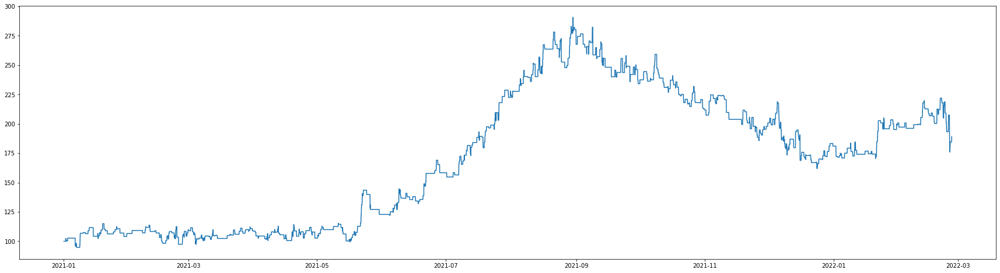

In [18]:
if reinvest_profit_flag == True:
    fig, ax = plt.subplots(figsize=(30, 8))
    ax.plot(budget_dict['time'], budget_dict['budget'])
else:
    print("Not reinvest profit")

In [19]:
if reinvest_profit_flag == True:
    print(f"Max drawdown: {round(max_drawdown * 100, 2)}%")

Max drawdown: 16.94%


In [20]:
win_rate = len(transaction_df[transaction_df['profit'] > 0]) / len(transaction_df)
print(f"Win rate: {round(win_rate * 100, 2)}%")

Win rate: 44.5%


In [21]:
for symbol in transaction_df['symbol'].unique():
    symbol_df = transaction_df[transaction_df['symbol'] == symbol]
    win_rate = len(symbol_df[symbol_df['profit'] > 0]) / len(symbol_df)
    print(f"{symbol} win rate: {round(win_rate * 100, 2)}%")

SOL-PERP win rate: 48.74%
ETH-PERP win rate: 40.0%
LUNA-PERP win rate: 44.59%


In [22]:
print(f"Distribution")
print(pd.DataFrame(transaction_df['profit_percent'].describe()))

Distribution
       profit_percent
count      919.000000
mean         0.185081
std          3.997916
min        -17.108651
25%         -2.217032
50%         -0.321052
75%          4.853103
max          4.866907


In [23]:
for symbol in transaction_df['symbol'].unique():
    temp_return = transaction_df[transaction_df['symbol'] == symbol]['profit_percent']
    
    print(f"Distribution {symbol}:")
    print(pd.DataFrame(temp_return.describe()))
    print("\n")

Distribution SOL-PERP:
       profit_percent
count      318.000000
mean         0.315506
std          4.345284
min        -16.798074
25%         -2.531584
50%         -0.164205
75%          4.853103
max          4.866907


Distribution ETH-PERP:
       profit_percent
count      305.000000
mean         0.325964
std          2.856543
min         -6.226959
25%         -1.313298
50%         -0.366378
75%          2.466147
max          4.866907


Distribution LUNA-PERP:
       profit_percent
count      296.000000
mean        -0.100204
std          4.573736
min        -17.108651
25%         -3.140866
50%         -0.337516
75%          4.853103
max          4.866907




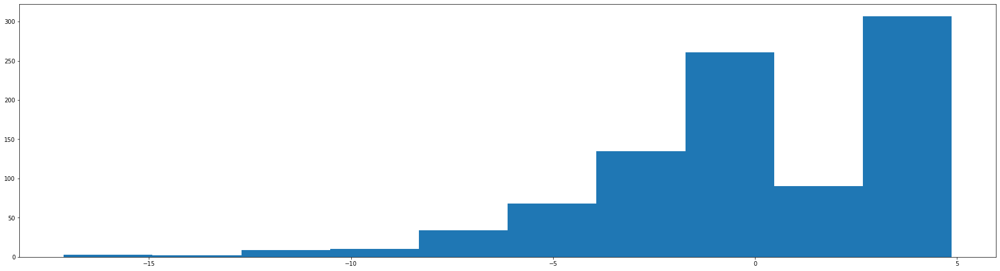

In [24]:
fig, ax = plt.subplots(figsize=(30, 8))
_ = ax.hist(transaction_df['profit_percent'], bins=10)